# Code for Bachelor Thesis in Economics at Heidelberg University
## by Daniel Schäffer

## Imports:

In [3]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch,Rectangle
import cartopy
import cartopy.feature as cf
import cartopy.crs as ccrs
import seaborn as sns
import folium
from folium.plugins import HeatMap, HeatMapWithTime
import cmocean
import cmocean.cm as cmo
import math
import colorcet as cc

In [4]:
from functions import plot_merra_data, plot_merra_data2, barplot, plot_outcome_data, plot_wind_vectorfield, plot_grid2,plot_wind_vectorfield2,plot_gpw_data, plot_centroids
import os
import pickle
import numpy as np
import pandas as pd
import os
from netCDF4 import Dataset

import matplotlib as mpl
import matplotlib.pyplot as plt

import statsmodels.api as sm

from numba import jit


In [5]:
mpl.font_manager._rebuild()
# Use Open Sans font family for all text.
plt.rc('font', family='Open Sans')
plt.rcParams['figure.dpi'] = 150

In [6]:
parent_directory = os.path.abspath(os.path.join(os.path.dirname(os.path.realpath("__file__")), os.pardir))

# 2. Data

## 2.1 dust data

In [7]:
#region: -20,0,25,25
#-30,-15,35,30

### Data

In [8]:
with open(parent_directory + '\\processed_data\\hourly_novapr_indices', 'rb') as pickle_file:
        hourly_novapr_indices = pickle.load(pickle_file)

with open(parent_directory + '\\processed_data\\hourly_junsep_indices', 'rb') as pickle_file:
        hourly_junsep_indices = pickle.load(pickle_file)

total_longitudes = np.load(parent_directory + '\\processed_data\\total_longitudes.npy')
total_latitudes = np.load(parent_directory + '\\processed_data\\total_latitudes.npy')

aod_monthly_data = np.load(parent_directory + '\\processed_data\\aod_monthly_data.npy')
aod_monthly_novapr_data = np.load(parent_directory + '\\processed_data\\aod_monthly_novapr_data.npy')
aod_monthly_junsep_data = np.load(parent_directory + '\\processed_data\\aod_monthly_junsep_data.npy')

west_africa_longitudes = np.load(parent_directory + '\\processed_data\\west_africa_longitudes.npy')
west_africa_latitudes = np.load(parent_directory + '\\processed_data\\west_africa_latitudes.npy')

#Dust
dust_daily_data = np.load(parent_directory + '\\processed_data\\dust_daily_data.npy')
dust_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\dust_daily_data_novapr.npy')
dust_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\dust_daily_data_junsep.npy')

#PM25
with open(parent_directory + '\\processed_data\\daily_novapr_indices', 'rb') as pickle_file:
        daily_novapr_indices = pickle.load(pickle_file)

with open(parent_directory + '\\processed_data\\daily_junsep_indices', 'rb') as pickle_file:
        daily_junsep_indices = pickle.load(pickle_file)

pm25_daily_data = np.load(parent_directory + '\\processed_data\\pm25_daily_data.npy')
pm25_daily_data_novapr = np.load(parent_directory + '\\processed_data\\pm25_daily_data_novapr.npy')
pm25_daily_data_junsep = np.load(parent_directory + '\\processed_data\\pm25_daily_data_junsep.npy')

bc_daily_data = np.load(parent_directory + '\\processed_data\\bc_daily_data.npy')
oc_daily_data = np.load(parent_directory + '\\processed_data\\oc_daily_data.npy')
ss_daily_data = np.load(parent_directory + '\\processed_data\\ss_daily_data.npy')
so4_daily_data = np.load(parent_directory + '\\processed_data\\so4_daily_data.npy')

so4_daily_data_novapr = np.load(parent_directory + '\\processed_data\\so4_daily_data_novapr.npy')
oc_daily_data_novapr = np.load(parent_directory + '\\processed_data\\oc_daily_data_novapr.npy')
bc_daily_data_novapr = np.load(parent_directory + '\\processed_data\\bc_daily_data_novapr.npy')
dust_daily_data_novapr = np.load(parent_directory + '\\processed_data\\dust_daily_data_novapr.npy')
ss_daily_data_novapr = np.load(parent_directory + '\\processed_data\\ss_daily_data_novapr.npy')

so4_daily_data_junsep = np.load(parent_directory + '\\processed_data\\so4_daily_data_junsep.npy')
oc_daily_data_junsep = np.load(parent_directory + '\\processed_data\\oc_daily_data_junsep.npy')
bc_daily_data_junsep = np.load(parent_directory + '\\processed_data\\bc_daily_data_junsep.npy')
dust_daily_data_junsep = np.load(parent_directory + '\\processed_data\\dust_daily_data_junsep.npy')
ss_daily_data_junsep = np.load(parent_directory + '\\processed_data\\ss_daily_data_junsep.npy')


data_total = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data.mean()/pm25_daily_data.mean(), oc_daily_data.mean()/pm25_daily_data.mean(),
                        bc_daily_data.mean()/pm25_daily_data.mean(), dust_daily_data.mean()/pm25_daily_data.mean(), ss_daily_data.mean()/pm25_daily_data.mean()]} 

data_junsep = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(), oc_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(),
                        bc_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(), dust_daily_data_junsep.mean()/pm25_daily_data_junsep.mean(),
                        ss_daily_data_junsep.mean()/pm25_daily_data_junsep.mean()]}   

data_novapr = {'composite': ['SO$_4$', 'OC', 'BC', 'DS$_{2.5}$', 'SS$_{2.5}$'],
              'value': [so4_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(), oc_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(),
                        bc_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(), dust_daily_data_novapr.mean()/pm25_daily_data_novapr.mean(),
                        ss_daily_data_novapr.mean()/pm25_daily_data_novapr.mean()]}  


  
# Create DataFrame  
data_total_df = pd.DataFrame(data_total)  
data_junsep_df = pd.DataFrame(data_junsep)  
data_novapr_df = pd.DataFrame(data_novapr)  

data_total_df['value'] = data_total_df['value']*100
data_junsep_df['value'] = data_junsep_df['value']*100
data_novapr_df['value'] = data_novapr_df['value']*100

data_total_df = data_total_df.set_index('composite')
data_junsep_df = data_junsep_df.set_index('composite')
data_novapr_df = data_novapr_df.set_index('composite')


#Wind
wind_eastward_hourly_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_data.npy')
wind_northward_hourly_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_data.npy')
wind_eastward_hourly_novapr_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_novapr_data.npy')
wind_northward_hourly_novapr_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_novapr_data.npy')
wind_eastward_hourly_junsep_data = np.load(parent_directory + '\\processed_data\\wind_eastward_hourly_junsep_data.npy')
wind_northward_hourly_junsep_data = np.load(parent_directory + '\\processed_data\\wind_northward_hourly_junsep_data.npy')

#Temperature
temperature_daily_data = np.load(parent_directory + '\\processed_data\\temperature_daily_data.npy')
temperature_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\temperature_daily_data_novapr.npy')
temperature_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\temperature_daily_data_junsep.npy')

#Precipitation
precipitation_daily_data = np.load(parent_directory + '\\processed_data\\precipitation_daily_data.npy')
precipitation_daily_data_novapr  = np.load(parent_directory + '\\processed_data\\precipitation_daily_data_novapr.npy')
precipitation_daily_data_junsep  = np.load(parent_directory + '\\processed_data\\precipitation_daily_data_junsep.npy')


#GDP Data
df_pwt = pd.read_csv(parent_directory + '\\processed_data\\df_pwt.csv')
df_pwt_growth = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_growth.csv')
df_pwt_growth_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_growth_per_cap.csv')
df_pwt_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_pwt_per_cap.csv')
df_wbdi = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi.csv')
df_wbdi_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_per_cap.csv')
df_wbdi_growth = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_growth.csv')
df_wbdi_per_cap_growth = pd.read_csv(parent_directory + '\\processed_data\\df_wbdi_per_cap_growth.csv')
df_mpd = pd.read_csv(parent_directory + '\\processed_data\\df_mpd.csv')
df_mpd_growth = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_growth.csv')
df_mpd_pop = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_pop.csv')
df_mpd_per_cap_growth = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_per_cap_growth.csv')
df_mpd_per_cap = pd.read_csv(parent_directory + '\\processed_data\\df_mpd_per_cap.csv')

#additional data

#centroids:
country_centroids = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\country_centroids\\country_centroids.txt', sep='\t')

# pop weights:
population_array = np.load(parent_directory + '\\processed_data\\population_array.npy')

benin_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ben.csv')
burkina_faso_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_bfa.csv')
gambia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gmb.csv')
ghana_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gha.csv')
guinea_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_gin.csv')
liberia_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_lbr.csv')
mali_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_mli.csv')
niger_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_ner.csv')
nigeria_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_nga.csv')
senegal_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sen.csv')
sierra_leone_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_sle.csv')
togo_population_df = pd.read_csv(parent_directory + '\\raw_data\\3.3_model_implementation\\population_estimates\\gpw_v4_admin_unit_center_points_population_estimates_rev11_tgo.csv')





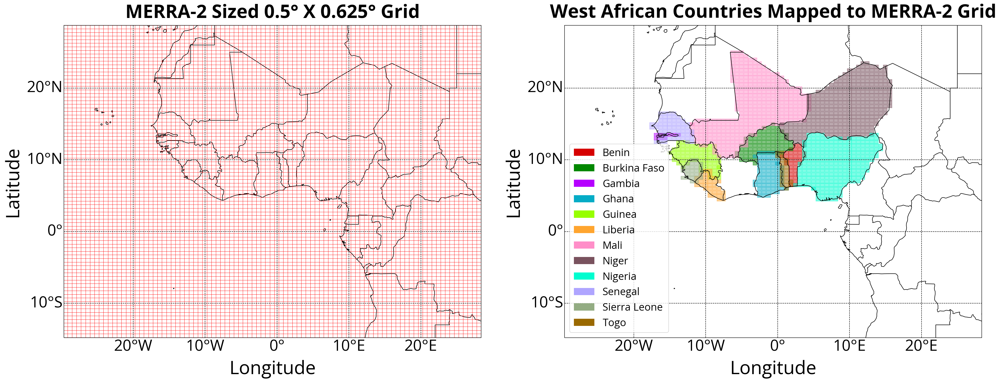

In [9]:
plot_grid2(west_africa_latitudes, west_africa_longitudes,
          ['MERRA-2 Sized 0.5° X 0.625° Grid', 'West African Countries Mapped to MERRA-2 Grid'],
          extent=[-30+(.25*1.5),29-(2*.3125),-15+(.3125/1.5),29-.25], borders = True,
          add_source_region=[False, False], plot_lines=[True,False], plot_grid_lines=[True,True], add_countries=[False,True],
          country_alpha=0.5,
          country_list=['benin', 'burkina_faso', 'gambia', 'ghana', 'guinea',
                        'liberia','mali', 'niger', 'nigeria', 'senegal',
                        'sierra_leone','togo'],
          country_names=['Benin', 'Burkina Faso', 'Gambia', 'Ghana', 'Guinea',
                        'Liberia','Mali', 'Niger', 'Nigeria', 'Senegal',
                        'Sierra Leone', 'Togo'],
          color_list=sns.color_palette(cc.glasbey_light, n_colors=12))

### Plots

#### Figure 8

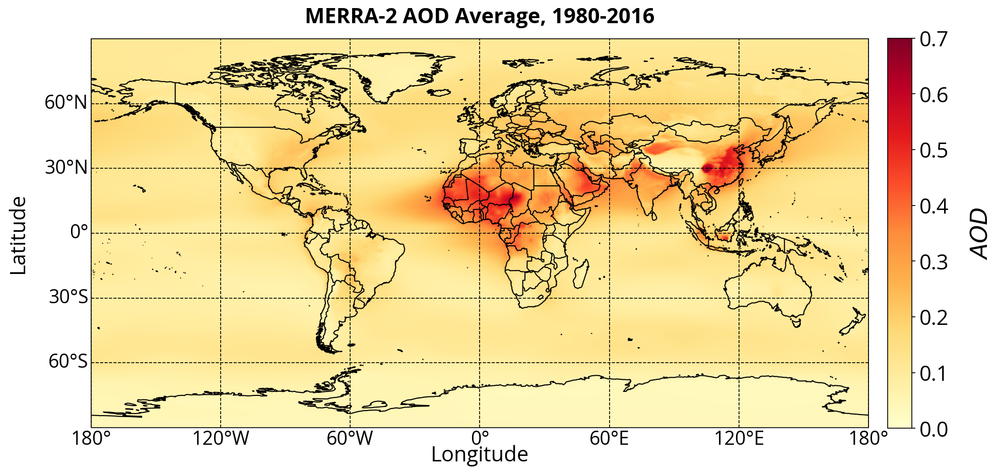

In [10]:
plot_merra_data(np.sum(aod_monthly_data, axis = 0)/aod_monthly_data.shape[0],
                total_longitudes, total_latitudes,'MERRA-2 AOD Average, ', '1980-2016',r'$AOD$',
                extent=[-180, 180, -90, 90], cbar_min = 0, cbar_max = 0.7, plot_grids=True, borders=True, shrink=.855, text_size=20, tick_size=20, labelsize=18, ax_text_left = -0.08, data_value_label = 20)

#### Figure 1

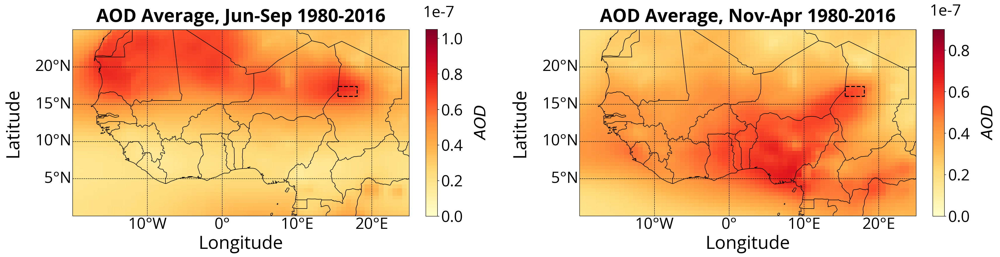

In [11]:
plot_merra_data2([np.sum(aod_monthly_junsep_data, axis = 0)/aod_monthly_junsep_data.shape[0], np.sum(aod_monthly_novapr_data, axis = 0)/aod_monthly_novapr_data.shape[0]],
                    total_longitudes, total_latitudes, titles=['AOD Average, ', 'AOD Average, '],
                    date=['Jun-Sep 1980-2016','Nov-Apr 1980-2016'], data_values=[r'$AOD$',r'$AOD$'] , extent=[-20,25,0,25],
                    borders = True, bodele = True, plot_grids = True, add_source_region = False,
                    add_bodele_source_exclusive = False, add_bodele_source_exclusive_alpha = 1,
                    cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [1.05,0.9], unit = [1,1],
                    figsize = (32,16), rows = 1, columns = 2, shrink=0.417, labelsize = 14, scientific_y =[1.1,.95],
                    rotation=90, lon_space = [-0.2,-0.2], lat_space=[-.15, -.15], cbar_labelpad=21, cb_frac= False)

#### $\text{Dust}_{2.5}$ Data

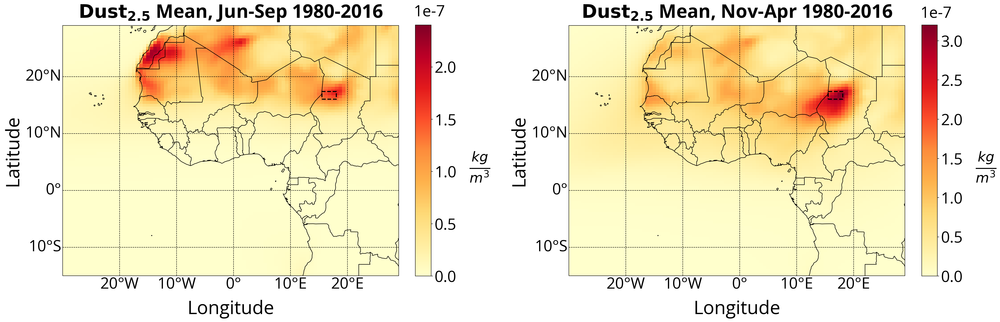

In [12]:
plot_merra_data2([(np.sum(dust_daily_data_junsep, axis = 0)/dust_daily_data_junsep.shape[0])*10 ** 7, (np.sum(dust_daily_data_novapr, axis = 0)/dust_daily_data_novapr.shape[0])*10 ** 7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['$\mathbf{Dust_{2.5}}$ Mean, ',
                        '$\mathbf{Dust_{2.5}}$ Mean, '],
                date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = True, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.4,3.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[2.45,3.25], lat_space = [-.12,-.12], lon_space=[-.17,-.17])

#### PM $_{\text{2.5}}$ Data

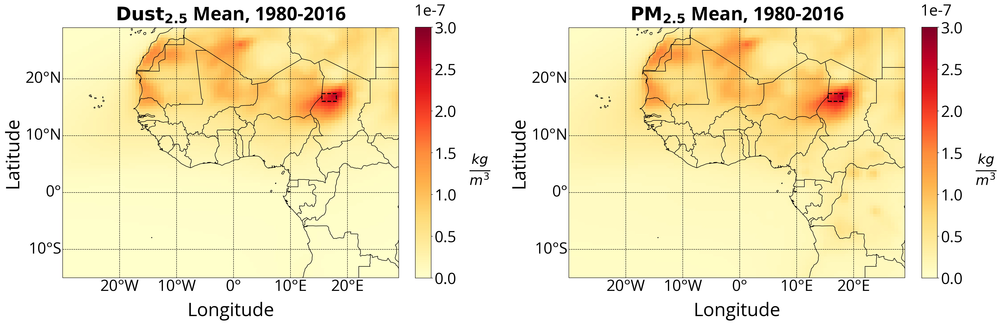

In [13]:
plot_merra_data2([(np.sum(dust_daily_data, axis = 0)/dust_daily_data.shape[0])*10**7, (np.sum(pm25_daily_data, axis = 0)/pm25_daily_data.shape[0])* 10**7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['$\mathbf{Dust_{2.5}}$ Mean, ', '$\mathbf{PM_{2.5}}$ Mean, '],
                date=['1980-2016', '1980-2016'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = True, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [3.0,3.0],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[3.1,3.1], lat_space = [-.12,-.12], lon_space=[-.17,-.17])

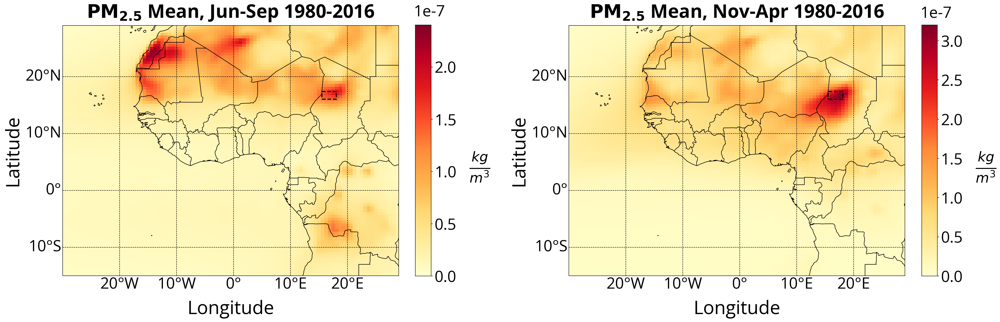

In [14]:
plot_merra_data2([(np.sum(pm25_daily_data_junsep, axis = 0)/pm25_daily_data_junsep.shape[0])*10**7, (np.sum(pm25_daily_data_novapr, axis = 0)/pm25_daily_data_novapr.shape[0])* 10**7],
                west_africa_longitudes, west_africa_latitudes,
                titles=['$\mathbf{PM_{2.5}}$ Mean, ', '$\mathbf{PM_{2.5}}$ Mean, '],
                date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'], data_values=[r'$\frac{kg}{m^3}$',r'$\frac{kg}{m^3}$'] ,
                extent=[-30,29,-15,29],
                borders = True, bodele = True, plot_grids = True, add_source_region = False,
                add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                cbar_color = ['YlOrRd','YlOrRd'], cbar_min = [0,0], cbar_max = [2.4,3.2],
                unit = [1,1], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                text_size = 36, value_size=30, scientific_y =[2.45,3.25], lat_space = [-.12,-.12], lon_space=[-.17,-.17])

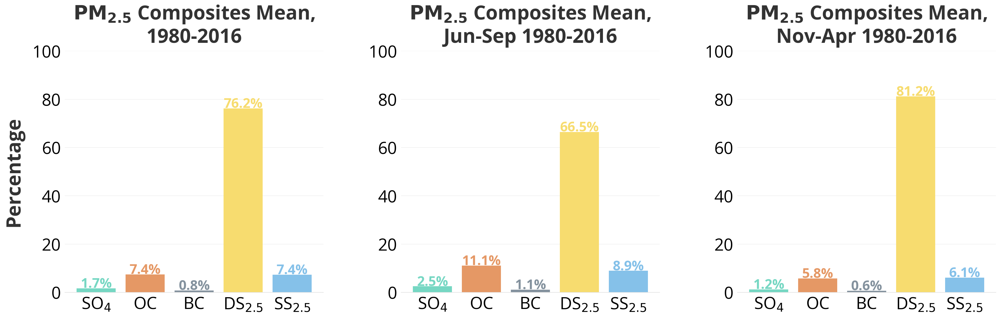

In [15]:
barplot(data = [data_total_df, data_junsep_df, data_novapr_df], columns = 3,
            titles = ['$\mathbf{PM_{2.5}}$ Composites Mean,\n1980-2016',
                      '$\mathbf{PM_{2.5}}$ Composites Mean,\nJun-Sep 1980-2016',
                      '$\mathbf{PM_{2.5}}$ Composites Mean,\nNov-Apr 1980-2016'],
            xlabels = ['PM$_{2.5}$ Composites', 'PM$_{2.5}$ Composites', 'PM$_{2.5}$ Composites'],
            ylabels=['Percentage', 'Percentage', 'Percentage'],
            bar_colors = ['#76d7c3', '#e59865', '#84929e', '#f7dc6f', '#85c1e9'], figsize = (25,8))


#### Wind Data

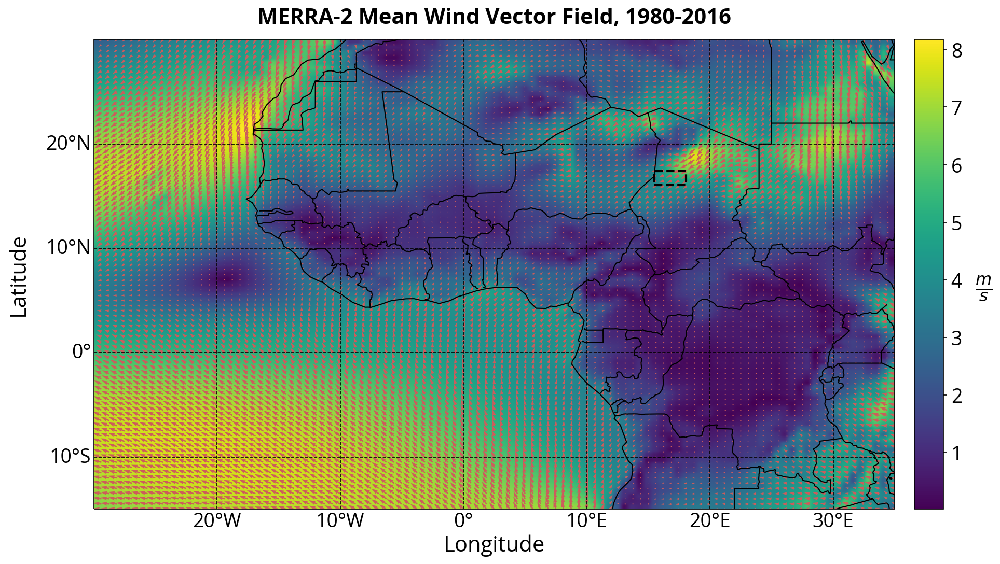

In [16]:
plot_wind_vectorfield(np.sum(wind_eastward_hourly_data, axis = 0)/wind_eastward_hourly_data.shape[0],
                      np.sum(wind_northward_hourly_data, axis = 0)/wind_northward_hourly_data.shape[0],
                      west_africa_longitudes, west_africa_latitudes, fig_size = (16,8),
                      title= 'MERRA-2 Mean Wind Vector Field, ', date='1980-2016', data_value=r'$\frac{m}{s}$', 
                      extent = [-30,35,30,-15], borders = True,
                      bodele = True, interpolation = "hermite")

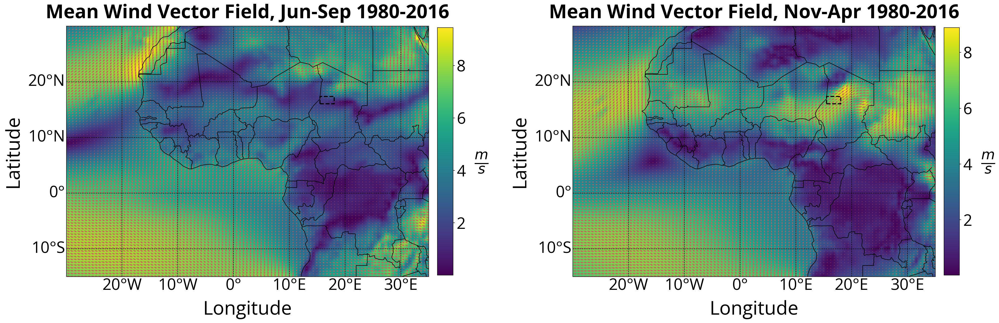

In [17]:
plot_wind_vectorfield2(np.sum(wind_eastward_hourly_junsep_data, axis = 0)/wind_eastward_hourly_junsep_data.shape[0],
                       np.sum(wind_northward_hourly_junsep_data, axis = 0)/wind_northward_hourly_junsep_data.shape[0],
                       west_africa_longitudes, west_africa_latitudes, fig_size = (32,16),
                       title= ['Mean Wind Vector Field, ', 'Mean Wind Vector Field, '], date=['Jun-Sep 1980-2016', 'Nov-Apr 1980-2016'],
                       data_value=r'$\frac{m}{s}$', 
                       extent = [-30,35,30,-15], borders = True,
                       bodele = True, interpolation = "hermite",
                       x_winds2=np.sum(wind_eastward_hourly_novapr_data, axis = 0)/wind_eastward_hourly_novapr_data.shape[0],
                       y_winds2=np.sum(wind_northward_hourly_novapr_data, axis = 0)/wind_northward_hourly_novapr_data.shape[0],
                       shrink=0.54)

#### Temperature and Precipitation Data

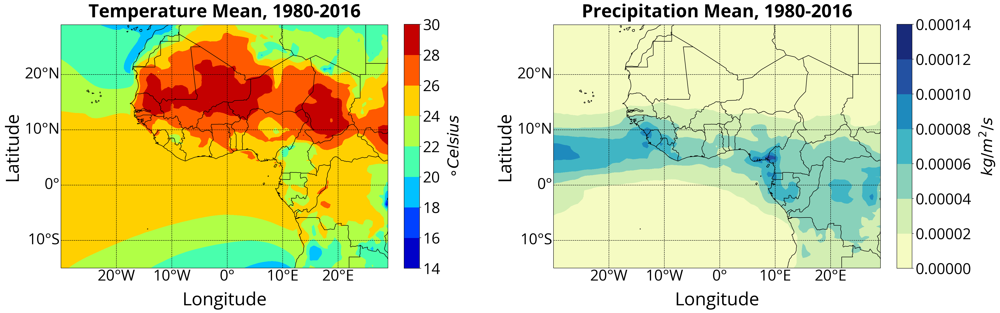

In [18]:
plot_merra_data2([(np.sum(temperature_daily_data, axis = 0)/temperature_daily_data.shape[0])-273.15,
                  np.sum(precipitation_daily_data, axis = 0)/precipitation_daily_data.shape[0]],
                  west_africa_longitudes, west_africa_latitudes,
                  titles=['Temperature Mean, ', 'Precipitation Mean, '],
                  date=['1980-2016', '1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'],
                  extent=[-30,29,-15,29],
                  borders = True, bodele = False, plot_grids = False, add_source_region = False,
                  add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                  cbar_color = ['jet','YlGnBu'], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                  text_size = 36, value_size=30, lat_space = [-.12,-.12], lon_space=[-.17,-.17],
                  cbar_labelpad=14, rotation=90, cb_frac=False)

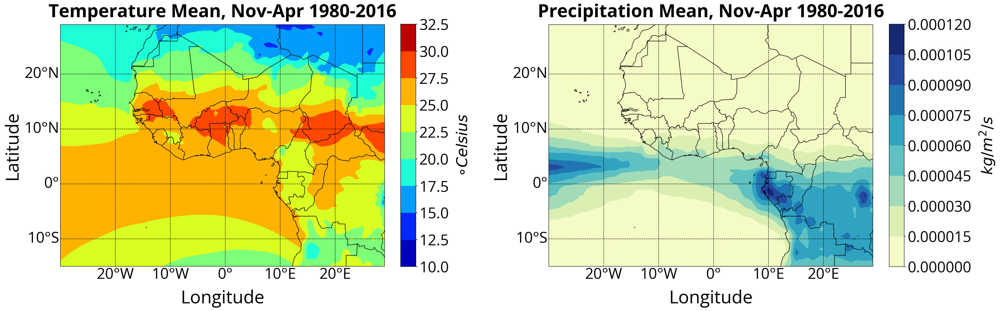

In [19]:
plot_merra_data2([(np.sum(temperature_daily_data_novapr, axis = 0)/temperature_daily_data_novapr.shape[0])-273.15,
                   np.sum(precipitation_daily_data_novapr, axis = 0)/precipitation_daily_data_novapr.shape[0]],
                   west_africa_longitudes, west_africa_latitudes,
                   titles=['Temperature Mean, ', 'Precipitation Mean, '],
                   date=['Nov-Apr 1980-2016','Nov-Apr 1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'],
                   extent=[-30,29,-15,29],
                   borders = True, bodele = False, plot_grids = False, add_source_region = False,
                   add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                   cbar_color = ['jet','YlGnBu'], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                   text_size = 36, value_size=30, lat_space = [-.12,-.12], lon_space=[-.17,-.17],
                   cbar_labelpad=14, rotation=90, cb_frac=False)

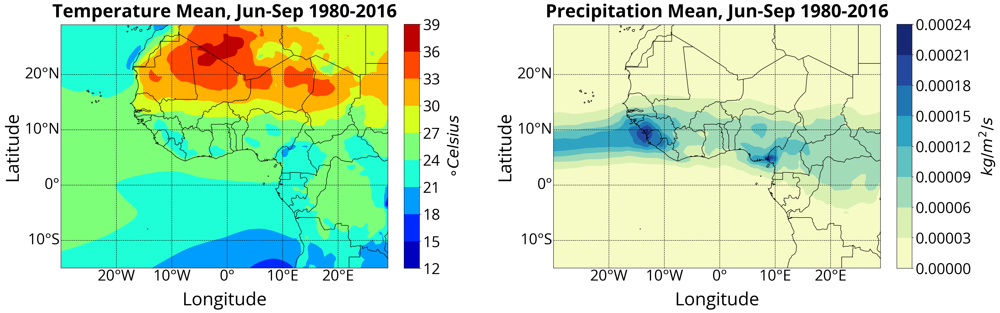

In [20]:
plot_merra_data2([(np.sum(temperature_daily_data_junsep, axis = 0)/temperature_daily_data_junsep.shape[0])-273.15,
                   np.sum(precipitation_daily_data_junsep, axis = 0)/precipitation_daily_data_junsep.shape[0]],
                   west_africa_longitudes, west_africa_latitudes,
                   titles=['Temperature Mean, ', 'Precipitation Mean, '],
                   date=['Jun-Sep 1980-2016','Jun-Sep 1980-2016'], data_values=[r'$\circ Celsius$',r'$kg/m^2/s$'],
                   extent=[-30,29,-15,29],
                   borders = True, bodele = False, plot_grids = False, add_source_region = False,
                   add_bodele_source_exclusive = False, source_region_alpha = 1, source_region_color='black', source_region_lw=.06,
                   cbar_color = ['jet','YlGnBu'], figsize = (32,16), rows = 1, columns = 2, shrink=0.56, labelsize = 14,
                   text_size = 36, value_size=30, lat_space = [-.12,-.12], lon_space=[-.17,-.17],
                   cbar_labelpad=14, rotation=90, cb_frac=False)

C:\Users\Daniel\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:43: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\Users\Daniel\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:39: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
C:\Users\Daniel\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:43: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\Users\Daniel\AppData\Roaming\Python\Python36\site-packages\numpy\core\_methods.py:39: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


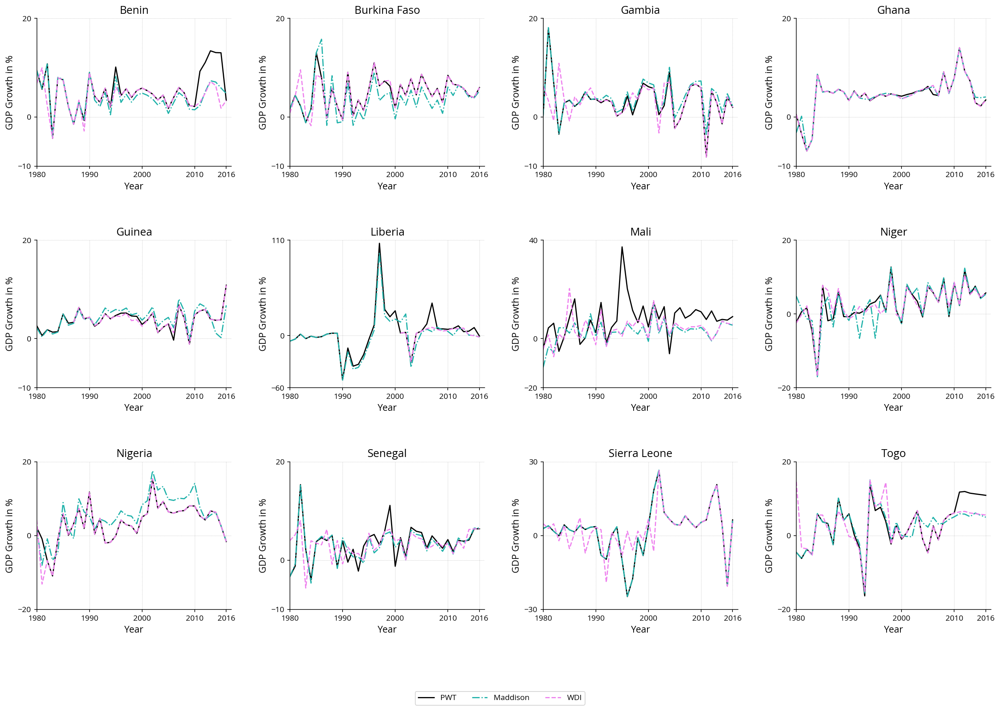

In [21]:
plot_outcome_data(df_pwt_growth.copy(), df_mpd_growth.copy(), df_wbdi_growth.copy(),
                  xlim = [1980, 2017], xticks = [1980,1990,2000,2010,2016],
                  xlabel = 'Year', ylabel = 'GDP Growth in %', figsize = (22,14))

#title='GDP per Capita Growth Comparison for West African Countries'

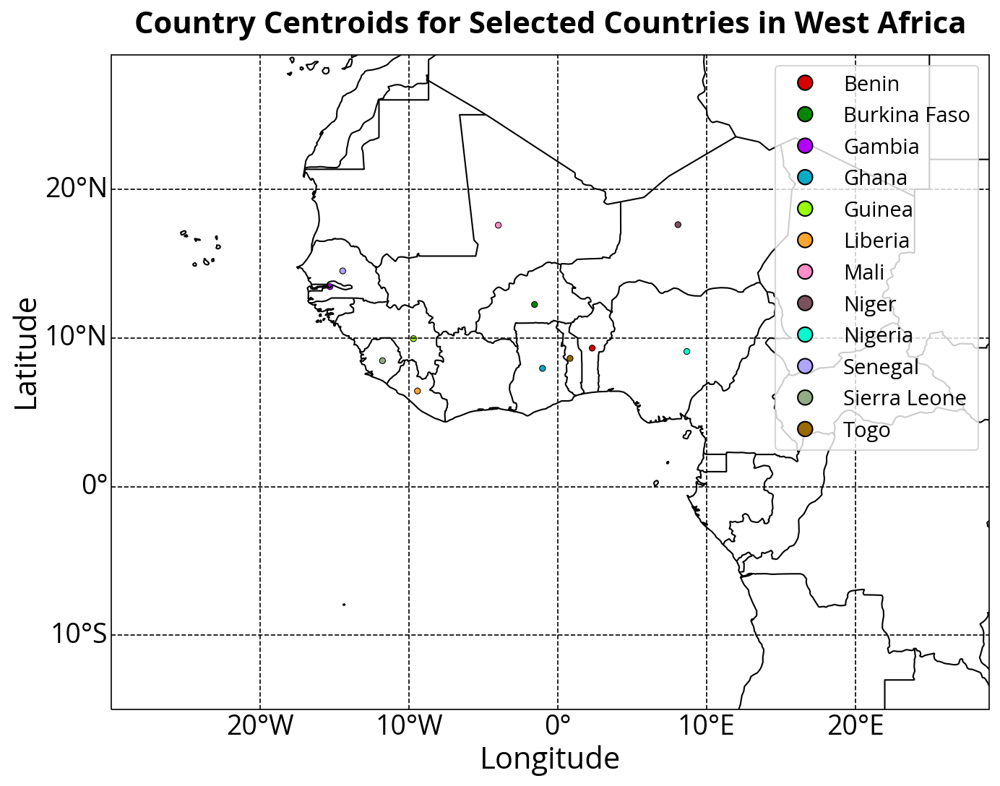

In [22]:
plot_centroids(country_centroids, title='Country Centroids for Selected Countries in West Africa', extent=[-30,29,-15,29], color='darkred', borders = True, plot_grid_lines = True, color_list=sns.color_palette(cc.glasbey_light, n_colors=12))

c:\Users\Daniel\Desktop\bachelor_thesis_final\Code\functions.py:1371: UserWarning: FixedFormatter should only be used together with FixedLocator
  cb.ax.set_yticklabels(['no data', '0.2', '0.4', '0.6', '0.8',r'$\geq 1$'])


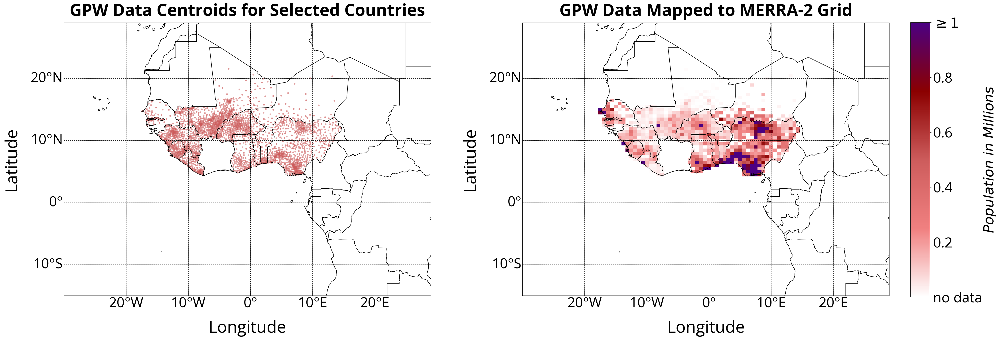

In [23]:
plot_gpw_data(population_array, west_africa_latitudes, west_africa_longitudes,
              extent=[-30,29,-15,29], borders = True,
              population_data = [benin_population_df, burkina_faso_population_df, gambia_population_df,
              ghana_population_df, guinea_population_df, liberia_population_df,
              mali_population_df, niger_population_df, nigeria_population_df,
              senegal_population_df, sierra_leone_population_df, togo_population_df],
              figsize= (32,16), shrink=.25, labelsize = 14, 
              cmap=mpl.colors.LinearSegmentedColormap.from_list("", ["white","lightcoral","indianred", "darkred","indigo"]),
              w_space=.25, cbar_pad=.001, cbar_labelpad=.6)

Summary statistics:

In [24]:
from functions import extract_seasonal_data

#aod daily data
aod_daily_data = np.load(parent_directory + '\\processed_data\\aod_daily_data.npy') 
aod_daily_data_novapr, aod_daily_data_junsep = extract_seasonal_data(aod_daily_data, daily_novapr_indices, daily_junsep_indices)


c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numba\core\ir_utils.py:2119: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'junsep_indices' of function 'extract_seasonal_data'.

For more information visit https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "functions.py", line 295:
@jit
def extract_seasonal_data(total_data, novapr_indices, junsep_indices):
^

  warnings.warn(NumbaPendingDeprecationWarning(msg, loc=loc))
c:\Users\Daniel\anaconda3\envs\bachelor_econ\lib\site-packages\numba\core\ir_utils.py:2119: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'novapr_indices' of function 'extract_seasonal_data'.

For more information visit https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of

In [25]:
latex_table1= fr"""\makecell{{Daily AOD}}&\makecell{{{round(float(np.mean(aod_daily_data)),4)}}}&\makecell{{{round(float(np.std(aod_daily_data)),4)}}}&\makecell{{{round(float(np.min(aod_daily_data)),4)}}}&\makecell{{{round(float(np.median(aod_daily_data)),4)}}}&\makecell{{{round(float(np.max(aod_daily_data)),4)}}}&\makecell{{{aod_daily_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Daily AOD ()}}&\makecell{{{round(float(np.mean(aod_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.std(aod_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.min(aod_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.median(aod_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.max(aod_daily_data_novapr)),4)}}}&\makecell{{{aod_daily_data_novapr.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Daily AOD ()}}&\makecell{{{round(float(np.mean(aod_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.std(aod_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.min(aod_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.median(aod_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.max(aod_daily_data_junsep)),4)}}}&\makecell{{{aod_daily_data_junsep.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Daily Dust}}&\makecell{{{'{:0.3e}'.format((float(np.mean(dust_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(dust_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(dust_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(dust_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(dust_daily_data))))}}}&\makecell{{{dust_daily_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Daily Dust ()}}&\makecell{{{'{:0.3e}'.format((float(np.mean(dust_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(dust_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(dust_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(dust_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(dust_daily_data_novapr))))}}}&\makecell{{{dust_daily_data_novapr.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Daily Dust ()}}&\makecell{{{'{:0.3e}'.format((float(np.mean(dust_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(dust_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(dust_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(dust_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(dust_daily_data_junsep))))}}}&\makecell{{{dust_daily_data_junsep.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Daily $\text{{PM}}_{{2.5}}$}}&\makecell{{{'{:0.3e}'.format((float(np.mean(pm25_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(pm25_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(pm25_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(pm25_daily_data))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(pm25_daily_data))))}}}&\makecell{{{pm25_daily_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Daily $\text{{PM}}_{{2.5}}}}$ ()&\makecell{{{'{:0.3e}'.format((float(np.mean(pm25_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(pm25_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(pm25_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(pm25_daily_data_novapr))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(pm25_daily_data_novapr))))}}}&\makecell{{{pm25_daily_data_novapr.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Daily $\text{{PM}}_{{2.5}}}}$ ()&\makecell{{{'{:0.3e}'.format((float(np.mean(pm25_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.std(pm25_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.min(pm25_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.median(pm25_daily_data_junsep))))}}}&\makecell{{{'{:0.3e}'.format((float(np.max(pm25_daily_data_junsep))))}}}&\makecell{{{pm25_daily_data_junsep.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Hourly Eastward Wind ()}}&\makecell{{{round(float(np.mean(wind_eastward_hourly_data)),4)}}}&\makecell{{{round(float(np.std(wind_eastward_hourly_data)),4)}}}&\makecell{{{round(float(np.min(wind_eastward_hourly_data)),4)}}}&\makecell{{{round(float(np.median(wind_eastward_hourly_data)),4)}}}&\makecell{{{round(float(np.max(wind_eastward_hourly_data)),4)}}}&\makecell{{{wind_eastward_hourly_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Hourly Eastward Wind ()}}&\makecell{{{round(float(np.mean(wind_eastward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.std(wind_eastward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.min(wind_eastward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.median(wind_eastward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.max(wind_eastward_hourly_novapr_data)),4)}}}&\makecell{{{wind_eastward_hourly_novapr_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Hourly Eastward Wind ()}}&\makecell{{{round(float(np.mean(wind_eastward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.std(wind_eastward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.min(wind_eastward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.median(wind_eastward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.max(wind_eastward_hourly_junsep_data)),4)}}}&\makecell{{{wind_eastward_hourly_junsep_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Hourly Northward Wind ()}}&\makecell{{{round(float(np.mean(wind_northward_hourly_data)),4)}}}&\makecell{{{round(float(np.std(wind_northward_hourly_data)),4)}}}&\makecell{{{round(float(np.min(wind_northward_hourly_data)),4)}}}&\makecell{{{round(float(np.median(wind_northward_hourly_data)),4)}}}&\makecell{{{round(float(np.max(wind_northward_hourly_data)),4)}}}&\makecell{{{wind_northward_hourly_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Hourly Northward Wind ()}}&\makecell{{{round(float(np.mean(wind_northward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.std(wind_northward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.min(wind_northward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.median(wind_northward_hourly_novapr_data)),4)}}}&\makecell{{{round(float(np.max(wind_northward_hourly_novapr_data)),4)}}}&\makecell{{{wind_northward_hourly_novapr_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Hourly Wind ()}}&\makecell{{{round(float(np.mean(wind_northward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.std(wind_northward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.min(wind_northward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.median(wind_northward_hourly_junsep_data)),4)}}}&\makecell{{{round(float(np.max(wind_northward_hourly_junsep_data)),4)}}}&\makecell{{{wind_northward_hourly_junsep_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Daily Temperature}}&\makecell{{{round(float(np.mean(temperature_daily_data)),4)}}}&\makecell{{{round(float(np.std(temperature_daily_data)),4)}}}&\makecell{{{round(float(np.min(temperature_daily_data)),4)}}}&\makecell{{{round(float(np.median(temperature_daily_data)),4)}}}&\makecell{{{round(float(np.max(temperature_daily_data)),4)}}}&\makecell{{{temperature_daily_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Daily Temperature ()}}&\makecell{{{round(float(np.mean(temperature_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.std(temperature_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.min(temperature_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.median(temperature_daily_data_novapr)),4)}}}&\makecell{{{round(float(np.max(temperature_daily_data_novapr)),4)}}}&\makecell{{{temperature_daily_data_novapr.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Wet Season Daily Temperature ()}}&\makecell{{{round(float(np.mean(temperature_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.std(temperature_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.min(temperature_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.median(temperature_daily_data_junsep)),4)}}}&\makecell{{{round(float(np.max(temperature_daily_data_junsep)),4)}}}&\makecell{{{temperature_daily_data_junsep.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Daily Precipitation}}&\makecell{{{'{:0.3e}'.format(float(np.mean(precipitation_daily_data)))}}}&\makecell{{{'{:0.3e}'.format(float(np.std(precipitation_daily_data)))}}}&\makecell{{{'{:0.3e}'.format(float(np.min(precipitation_daily_data)))}}}&\makecell{{{'{:0.3e}'.format(float(np.median(precipitation_daily_data)))}}}&\makecell{{{'{:0.3e}'.format(float(np.max(precipitation_daily_data)))}}}&\makecell{{{precipitation_daily_data.size}}}\\
     \rule{{0pt}}{{4.5ex}}
     \makecell{{Dry Season Daily Precipitation ()}}&\makecell{{{'{:0.3e}'.format(float(np.mean(precipitation_daily_data_novapr)))}}}&\makecell{{{'{:0.3e}'.format(float(np.std(precipitation_daily_data_novapr)))}}}&\makecell{{{'{:0.3e}'.format(float(np.min(precipitation_daily_data_novapr)))}}}&\makecell{{{'{:0.3e}'.format(float(np.median(precipitation_daily_data_novapr)))}}}&\makecell{{{'{:0.3e}'.format(float(np.max(precipitation_daily_data_novapr)))}}}&\makecell{{{precipitation_daily_data_novapr.size}}}\\
     \rule{{0pt}}{{4.5ex}}
    \makecell{{Wet Season Daily Precipitation ()}}&\makecell{{{'{:0.3e}'.format(float(np.mean(precipitation_daily_data_junsep)))}}}&\makecell{{{'{:0.3e}'.format(float(np.std(precipitation_daily_data_junsep)))}}}&\makecell{{{'{:0.3e}'.format(float(np.min(precipitation_daily_data_junsep)))}}}&\makecell{{{'{:0.3e}'.format(float(np.median(precipitation_daily_data_junsep)))}}}&\makecell{{{'{:0.3e}'.format(float(np.max(precipitation_daily_data_junsep)))}}}&\makecell{{{precipitation_daily_data_junsep.size}}}\\
     \rule{{0pt}}{{5ex}}"""

In [26]:
print(latex_table1)

\makecell{Daily AOD}&\makecell{0.2889}&\makecell{0.2331}&\makecell{0.0}&\makecell{0.2196}&\makecell{33.1096}&\makecell{129135825}\\
     \rule{0pt}{4.5ex}
     \makecell{Dry Season Daily AOD ()}&\makecell{0.2634}&\makecell{0.228}&\makecell{0.0}&\makecell{0.1916}&\makecell{33.1096}&\makecell{64085385}\\
     \rule{0pt}{4.5ex}
     \makecell{Wet Season Daily AOD ()}&\makecell{0.3365}&\makecell{0.2394}&\makecell{0.0133}&\makecell{0.2718}&\makecell{22.0286}&\makecell{43131270}\\
     \rule{0pt}{4.5ex}
     \makecell{Daily Dust}&\makecell{2.956e-08}&\makecell{4.820e-08}&\makecell{0.000e+00}&\makecell{7.547e-09}&\makecell{1.747e-06}&\makecell{129135825}\\
     \rule{0pt}{4.5ex}
     \makecell{Dry Season Daily Dust ()}&\makecell{3.526e-08}&\makecell{5.304e-08}&\makecell{0.000e+00}&\makecell{1.403e-08}&\makecell{1.747e-06}&\makecell{64085385}\\
     \rule{0pt}{4.5ex}
     \makecell{Wet Season Daily Dust ()}&\makecell{2.271e-08}&\makecell{4.111e-08}&\makecell{2.676e-21}&\makecell{2.706e-09}&\ma

In [27]:
df_wbdi_growth

,Unnamed: 0,country,1980,1981,1982,1983,1984,1985,1986,1987,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,0,Benin,0.067818,0.099542,0.022351,-0.043478,0.079298,0.075303,0.021711,-0.015000,...,0.048966,0.023193,0.021141,0.029638,0.048112,0.071914,0.063577,0.017782,0.033397,0.056716
1,1,Burkina Faso,0.007969,0.042553,0.095622,0.003460,-0.017787,0.085174,0.079554,-0.002363,...,0.058000,0.029620,0.084463,0.066226,0.064527,0.057926,0.043268,0.039212,0.059580,0.062035
2,2,Gambia,0.062701,0.033219,-0.007646,0.108832,0.035353,-0.008123,0.040911,0.024543,...,0.062559,0.066657,0.059083,-0.081304,0.052416,0.028728,-0.014074,0.040581,0.019434,0.048226
3,3,Ghana,0.004717,-0.035031,-0.069237,-0.045637,0.086476,0.050916,0.051992,0.047949,...,0.091498,0.048445,0.078997,0.140471,0.092928,0.073125,0.028562,0.021208,0.033735,0.081289
4,4,Guinea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032999,...,0.041330,-0.011226,0.048134,0.056121,0.059153,0.039457,0.036965,0.038259,0.108206,0.103000
5,5,Liberia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.071457,0.053005,0.060998,0.082008,0.079938,0.086873,0.007014,-0.000186,-0.015550,0.024552
6,6,Mali,-0.043258,0.015088,-0.073784,0.018209,-0.002870,0.202866,0.026926,-0.001392,...,0.047731,0.048063,0.053139,0.032131,-0.008367,0.022951,0.070847,0.061718,0.058523,0.053055
7,7,Niger,-0.024550,-0.001777,0.021745,-0.038636,-0.168198,0.077181,0.063521,0.000883,...,0.077314,0.019626,0.085782,0.023578,0.105489,0.053151,0.066421,0.043926,0.057409,0.050014
8,8,Nigeria,0.042048,-0.131279,-0.068034,-0.109241,-0.011156,0.059130,0.000609,0.032001,...,0.067645,0.080369,0.080057,0.053079,0.042301,0.066713,0.063097,0.026527,-0.016169,0.008059
9,9,Senegal,0.039878,0.051802,0.080104,-0.056475,0.039358,0.034631,0.031270,0.062559,...,0.037032,0.027521,0.033909,0.013341,0.040030,0.024124,0.062241,0.063670,0.063561,0.074075


In [28]:
df_pwt_growth.describe().T[1:].describe().applymap(lambda x: f"{x:0.3%}")

,count,mean,std,min,25%,50%,75%,max
count,3700.000%,3700.000%,3700.000%,3700.000%,3700.000%,3700.000%,3700.000%,3700.000%
mean,1200.000%,4.012%,7.022%,-9.098%,1.866%,3.985%,6.061%,17.503%
std,0.000%,3.177%,5.161%,12.569%,2.544%,2.390%,2.197%,17.114%
min,1200.000%,-3.305%,2.179%,-51.031%,-4.852%,-3.928%,-0.902%,2.178%
25%,1200.000%,1.824%,3.834%,-14.225%,0.643%,2.631%,4.717%,10.124%
50%,1200.000%,4.861%,5.634%,-4.666%,2.397%,4.388%,6.150%,13.064%
75%,1200.000%,5.901%,8.364%,-1.175%,3.811%,5.452%,7.577%,18.170%
max,1200.000%,11.031%,30.788%,4.006%,5.748%,10.173%,11.437%,106.280%


In [29]:
df_pwt_growth.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,12.0,5.500000,3.605551,0.000000,2.750000,5.500000,8.250000,11.000000
1980,12.0,-0.000995,0.043288,-0.062870,-0.035503,0.003513,0.023130,0.094176
1981,12.0,0.018239,0.063203,-0.061910,-0.017634,0.006093,0.043302,0.180420
1982,12.0,0.025925,0.066339,-0.069218,0.002904,0.017774,0.064301,0.153399
1983,12.0,-0.033055,0.035151,-0.109241,-0.048523,-0.039279,-0.009022,0.021779
1984,12.0,0.009013,0.067102,-0.168253,-0.007205,0.015102,0.047411,0.086476
1985,12.0,0.053337,0.037260,-0.020198,0.036357,0.050400,0.075772,0.130638
1986,12.0,0.035835,0.047987,-0.018416,0.011101,0.026313,0.047190,0.161193
1987,12.0,0.013528,0.027466,-0.024840,-0.014084,0.024330,0.034737,0.047949
1988,12.0,0.050011,0.025803,0.002497,0.029827,0.053585,0.061499,0.101241


In [30]:
df_pwt_growth.describe()

,Unnamed: 0,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,5.500000,-0.000995,0.018239,0.025925,-0.033055,0.009013,0.053337,0.035835,0.013528,0.050011,...,0.076390,0.064483,0.044738,0.066126,0.059007,0.089724,0.077449,0.057770,0.039793,0.051335
std,3.605551,0.043288,0.063203,0.066339,0.035151,0.067102,0.037260,0.047987,0.027466,0.025803,...,0.097532,0.021792,0.037385,0.023431,0.056342,0.036584,0.051297,0.038344,0.084352,0.040155
min,0.000000,-0.062870,-0.061910,-0.069218,-0.109241,-0.168253,-0.020198,-0.018416,-0.024840,0.002497,...,-0.011751,0.036825,-0.011226,0.021140,-0.081304,0.040060,0.028728,-0.014074,-0.204908,-0.016169
25%,2.750000,-0.035503,-0.017634,0.002904,-0.048523,-0.007205,0.036357,0.011101,-0.014084,0.029827,...,0.038702,0.047057,0.023972,0.052136,0.045505,0.057481,0.044337,0.039833,0.035244,0.029906
50%,5.500000,0.003513,0.006093,0.017774,-0.039279,0.015102,0.050400,0.026313,0.024330,0.053585,...,0.054624,0.060280,0.040146,0.066996,0.064689,0.101726,0.062320,0.048796,0.041978,0.058233
75%,8.250000,0.023130,0.043302,0.064301,-0.009022,0.047411,0.075772,0.047190,0.034737,0.061499,...,0.071278,0.083624,0.069493,0.080965,0.084671,0.114375,0.083533,0.075940,0.079535,0.070035
max,11.000000,0.094176,0.180420,0.153399,0.021779,0.086476,0.130638,0.161193,0.047949,0.101241,...,0.375000,0.095877,0.117465,0.108691,0.140470,0.151828,0.207153,0.130642,0.130213,0.108943
